# Algo test

In [1]:
import torch
import torch.nn as nn
from torchvision.models.segmentation import fcn_resnet50
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from PIL import Image
import os
import random
import io
from IPython.display import Image as IPyImage, display

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

PyTorch version: 2.9.1+cu128
CUDA available: True


# Load data

In [2]:
tiff_path = "../data/EFR/Greyscale/EFRGP01_00.tif"

with tifffile.TiffFile(tiff_path) as tif:
    shape = tif.series[0].shape
    print(f"Image dimensions: {shape}")
    print(f"Data type: {tif.series[0].dtype}")
        
    if len(shape) == 3:
        depth, height, width = shape
    elif len(shape) == 2:
        height, width = shape
        depth = 1
    else:
        print("Unexpected image dimensions!")
            
    print(f"Depth (Z): {depth}, Height (Y): {height}, Width (X): {width}")

def display_gif(frames) :
    # Save as GIF in-memory
    gif_buf = io.BytesIO()
    frames[0].save(gif_buf, format='GIF', save_all=True, append_images=frames[1:], duration=100, loop=0)
    frames[0].save("segmentation_alexis.gif", format='GIF', save_all=True, append_images=frames[1:], duration=100, loop=0)
    gif_buf.seek(0)
    
    # Display the GIF in notebook
    display(IPyImage(data=gif_buf.read()))

Image dimensions: (1600, 1400, 1400)
Data type: uint16
Depth (Z): 1600, Height (Y): 1400, Width (X): 1400


# Region Sample

In [3]:
def read_voxel_region(tiff_path, region_size=100, random_offset_range=50):
    with tifffile.TiffFile(tiff_path) as tif:
        shape = tif.series[0].shape
        
        if len(shape) == 3:
            depth, height, width = shape
        elif len(shape) == 2:
            height, width = shape
            depth = 1
        else:
            raise ValueError("Unexpected image dimensions!")
        
        center_z = depth // 2
        center_y = height // 2
        center_x = width // 2
        
        offset_z = random.randint(-random_offset_range, random_offset_range)
        offset_y = random.randint(-random_offset_range, random_offset_range)
        offset_x = random.randint(-random_offset_range, random_offset_range)
        
        start_z = max(0, min(center_z + offset_z - region_size//2, depth - region_size))
        start_y = max(0, min(center_y + offset_y - region_size//2, height - region_size))
        start_x = max(0, min(center_x + offset_x - region_size//2, width - region_size))
        
        end_z = start_z + region_size
        end_y = start_y + region_size
        end_x = start_x + region_size
        
        print(f"Reading region: Z[{start_z}:{end_z}], Y[{start_y}:{end_y}], X[{start_x}:{end_x}]")
        
        region = tif.asarray()[start_z:end_z, start_y:end_y, start_x:end_x]

        
        return region, (start_z, start_y, start_x)

print("Extracting 100x100x100 voxel region...")
voxel_region, start_coords = read_voxel_region(tiff_path, region_size=300, random_offset_range=50)

print(f"Region shape: {voxel_region.shape}")
print(f"Data type: {voxel_region.dtype}")
print(f"Value range: {voxel_region.min()} to {voxel_region.max()}")
print(f"Start coordinates: Z={start_coords[0]}, Y={start_coords[1]}, X={start_coords[2]}")

voxel = voxel_region.astype(np.float32)
print(f"PyTorch tensor shape: {voxel.shape}")
print(f"PyTorch tensor device: {voxel.device}")

Extracting 100x100x100 voxel region...
Reading region: Z[687:987], Y[508:808], X[518:818]
Region shape: (300, 300, 300)
Data type: uint16
Value range: 10059 to 63286
Start coordinates: Z=687, Y=508, X=518
PyTorch tensor shape: (300, 300, 300)
PyTorch tensor device: cpu


# Preprocessing

In [5]:
from scipy.ndimage import binary_erosion
from scipy.ndimage import binary_dilation

def normalize_image(imgs):    
    # on garde que les valeurs positives pour la normalisation
    positive_vals = imgs[imgs > 0]
    mu = np.mean(positive_vals)
    sigma = np.std(positive_vals)
    
    # on mets la normalisation 
    norm_imgs = (imgs - mu) / (5 * sigma)
    
    # Remettre à zéro les valeurs initialement nulles
    norm_imgs[imgs == 0] = 0
    return norm_imgs

from scipy.ndimage import binary_fill_holes

def fill_internal_holes_3d(binary_tensor: np.ndarray) -> torch.Tensor:
    binary_np = binary_tensor.astype(bool)
    filled = binary_fill_holes(binary_np)
    return filled

def dilate_3d(
    volume: np.ndarray,
    iterations: int = 1,
    structure: np.ndarray | None = None
) -> np.ndarray:
    if volume.ndim != 3:
        raise ValueError("Input must be a 3D array")

    volume = volume.astype(bool)

    if structure is None:
        structure = np.ones((3, 3, 3), dtype=bool)

    dilated = binary_dilation(
        volume,
        structure=structure,
        iterations=iterations
    )

    return dilated.astype(np.uint8)

def erode_3d(
    volume: np.ndarray,
    iterations: int = 1,
    structure: np.ndarray | None = None
) -> np.ndarray:
    if volume.ndim != 3:
        raise ValueError("Input must be a 3D array")

    volume = volume.astype(bool)

    if structure is None:
        structure = np.ones((3, 3, 3), dtype=bool)

    eroded = binary_erosion(
        volume,
        structure=structure,
        iterations=iterations
    )
    return eroded.astype(np.uint8)

# Normalize image
voxel_normalized = normalize_image(voxel)

# Binarize image
voxel_binary = np.where(voxel_normalized[:] > 0, 1, 0)
voxel_tensor_unerosed = torch.from_numpy(voxel_binary.astype(np.float32)).to("cuda")

# Fill holes
voxel_binary = fill_internal_holes_3d(voxel_binary)

# Erosion
for _ in range(1) :
    voxel_binary = erode_3d(voxel_binary, iterations=1)
    voxel_binary = dilate_3d(voxel_binary, iterations=1)



# To tensor
voxel_tensor = torch.from_numpy(voxel_binary.astype(np.float32)).to("cuda")

# To heightmap

In [6]:
import torch
import numpy as np
from scipy.ndimage import distance_transform_edt

def distance_heightmap_3d(binary_tensor: torch.Tensor) -> torch.Tensor:
    """
    Compute a 3D heightmap where each voxel stores the distance
    to the nearest zero voxel.

    Args:
        binary_tensor (torch.Tensor): 3D tensor with values {0, 1}

    Returns:
        torch.Tensor: Distance transform (float32)
    """
    if binary_tensor.ndim != 3:
        raise ValueError("Input must be a 3D tensor")

    # Convert to NumPy (SciPy expects NumPy arrays)
    binary_np = binary_tensor.cpu().numpy().astype(bool)

    # Distance to nearest False (0)
    dist_np = distance_transform_edt(binary_np)

    # Back to torch
    return torch.from_numpy(dist_np).float()

voxel_tensor_heightmap = distance_heightmap_3d(voxel_tensor)

# More preprocessing

In [7]:
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

def watershed_collision_mask_3d(
    distance_tensor: torch.Tensor,
    foreground_mask: torch.Tensor | None = None,
    smooth_sigma: float = 1.0,
    min_peak_distance: int = 3,
    ) -> torch.Tensor:
    """
    Detect watershed collision (ridge) voxels in a 3D distance field.
    
    
    Args:
    distance_tensor (torch.Tensor):
    3D tensor containing the distance heightmap.
    foreground_mask (torch.Tensor | None):
    Boolean or {0,1} tensor defining valid grain region.
    If None, distance > 0 is used.
    smooth_sigma (float):
    Gaussian smoothing sigma (in voxels).
    min_peak_distance (int):
    Minimum distance between grain centers.
    
    
    Returns:
    torch.Tensor:
    Boolean tensor where True indicates watershed collision voxels.
    """
    if distance_tensor.ndim != 3:
        raise ValueError("distance_tensor must be 3D")
    
    
    # Move to NumPy
    dist_np = distance_tensor.cpu().numpy()
    
    
    if foreground_mask is None:
        mask_np = dist_np > 0
    else:
        mask_np = foreground_mask.cpu().numpy().astype(bool)
    
    
    # Smooth distance field (very important for stability)
    dist_smooth = ndi.gaussian_filter(dist_np, sigma=smooth_sigma)
    
    
    # Find grain centers (local maxima)
    peaks = peak_local_max(
    dist_smooth,
    labels=mask_np,
    min_distance=min_peak_distance,
    exclude_border=False,
    )
    
    
    # Create marker image
    markers = np.zeros_like(dist_np, dtype=np.int32)
    for i, (z, y, x) in enumerate(peaks, start=1):
        markers[z, y, x] = i
    
    
    # Watershed on inverted distance
    labels = watershed(
    -dist_smooth,
    markers,
    mask=mask_np,
    )
    
    
    # Watershed lines: where label == 0
    collision_mask = labels == 0
    
    
    # Back to torch
    return torch.from_numpy(collision_mask).to(distance_tensor.device), labels

collision_mask, labels = watershed_collision_mask_3d(voxel_tensor_heightmap, smooth_sigma=3.0)


# Zero out collision voxels
isolated_heightmap = voxel_tensor_heightmap.clone()
isolated_heightmap[collision_mask] = 0.0

print((isolated_heightmap - voxel_tensor_heightmap).sum())

tensor(-774.3131)


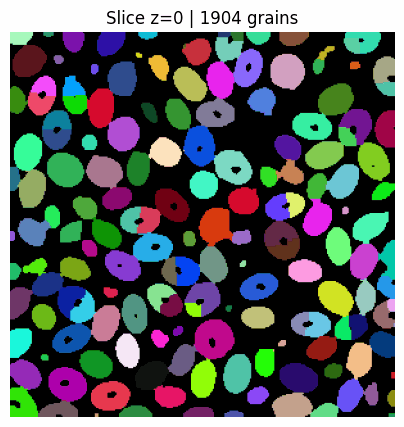

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import io
from PIL import Image

# ---- Setup ----
slices = list(range(300))
frames = []

zmax = labels.shape[0]
num_labels = labels.max() + 1

# Create ONE color per label (RGB)
rng = np.random.default_rng(42)
colors = rng.random((num_labels, 3))
colors[0] = 0.0  # background = black

# ---- Loop over slices ----
for z in slices:
    if z >= zmax:
        break

    fig, ax = plt.subplots(figsize=(5, 5))

    # Map labels -> colors
    img = colors[labels[z]]

    ax.imshow(img)
    ax.set_title(f"Slice z={z} | {num_labels-1} grains")
    ax.axis("off")

    buf = io.BytesIO()
    fig.savefig(buf, format="png", bbox_inches="tight")
    plt.close(fig)

    buf.seek(0)
    frames.append(Image.open(buf))

display_gif(frames)

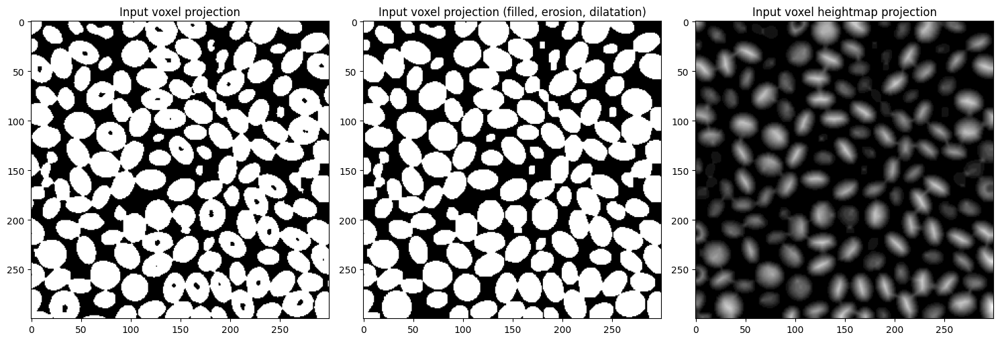

In [69]:
INDEX = 20
voxel_2d = voxel_tensor[INDEX]
voxel_2d_heightmap = voxel_tensor_heightmap[INDEX]

# Display using matplotlib (colormap for segmentation)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(voxel_tensor_unerosed[INDEX].cpu().numpy(), cmap='gray')
axs[0].set_title('Input voxel projection')
axs[1].imshow(voxel_2d.cpu().numpy(), cmap='gray')
axs[1].set_title('Input voxel projection (filled, erosion, dilatation)')
axs[2].imshow(voxel_2d_heightmap.cpu().numpy(), cmap='gray')
axs[2].set_title('Input voxel heightmap projection')
plt.tight_layout()
plt.show()  # Or plt.savefig('prediction.png')

In [139]:
from scipy.ndimage import maximum_filter

def find_3d_summits(heightmap: torch.Tensor) -> torch.Tensor:
    """
    Find all 3D local maxima (summits) in a heightmap.

    Args:
        heightmap (torch.Tensor): 3D tensor (D, H, W)

    Returns:
        torch.Tensor: Nx3 tensor of summit coordinates (z, y, x)
    """
    if heightmap.ndim != 3:
        raise ValueError("Input must be a 3D tensor")

    hm_np = heightmap.cpu().numpy()

    # 3x3x3 neighborhood maximum
    local_max = maximum_filter(hm_np, size=3, mode="constant")

    # Summit condition
    summits_mask = (hm_np == local_max) & (hm_np > 0)

    coords = np.column_stack(np.nonzero(summits_mask))
    return torch.from_numpy(coords)

import random
frames = []
def plot_summits_on_slices(
    heightmap: torch.Tensor,
    summits: torch.Tensor,
    n_slices: int = 3
):
    """
    Plot random slices of a 3D heightmap with summit points overlaid.

    Args:
        heightmap (torch.Tensor): 3D tensor (D, H, W)
        summits (torch.Tensor): Nx3 tensor of (z, y, x)
        n_slices (int): Number of random slices to plot
    """
    D = heightmap.shape[0]
    slices = [a for a in range(50)]
    
    for z in slices:
        fig, ax = plt.subplots(figsize=(5, 5))
    
        img = heightmap[z].cpu().numpy()
        ax.imshow(img, cmap="inferno")
    
        mask = summits[:, 0] == z
        y = summits[mask, 1]
        x = summits[mask, 2]
    
        ax.scatter(x, y, s=40, c="cyan", marker="x")
        ax.set_title(f"Slice z={z} | {len(x)} summits")
        ax.axis("off")
    
        buf = io.BytesIO()
        fig.savefig(buf, format="png", bbox_inches="tight")
        plt.close(fig)
    
        buf.seek(0)
        frames.append(Image.open(buf))

In [ ]:
summits = find_3d_summits(voxel_tensor_heightmap)
plot_summits_on_slices(voxel_tensor_heightmap, summits)

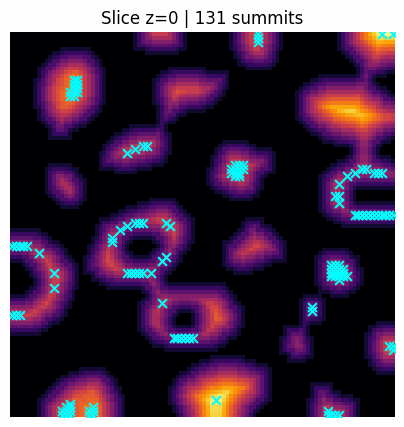

In [141]:
display_gif(frames)

In [162]:
binary = voxel_tensor.cpu().numpy()
for _ in range(3) :
   binary = erode_3d(binary, iterations=1)
    #binary = dilate_3d(binary, iterations=1)
    
binary = torch.from_numpy(binary)

import torch
import numpy as np
from scipy.ndimage import label, distance_transform_edt
from skimage.segmentation import watershed
import matplotlib.pyplot as plt
import random

def color_balls_single_seed(binary: torch.Tensor, summits: torch.Tensor):
    """
    Color each ball with one stable color even if multiple summits are detected.
    Slightly connected balls are separated using watershed.
    
    Args:
        binary: 3D binary tensor (D,H,W)
        summits: Nx3 tensor of summit coordinates (z,y,x)
    
    Returns:
        colors_rgb: 3D float tensor (D,H,W,3) with RGB colors
        labels: 3D int tensor of watershed labels
    """
    binary_np = binary.cpu().numpy().astype(bool)
    
    # Fill holes
    # Optional: use scipy.ndimage.binary_fill_holes if necessary
    
    # Label connected components
    labeled, n_labels = label(binary_np)
    
    # Select one summit per connected component
    seeds = np.zeros_like(binary_np, dtype=int)
    used_labels = set()
    seed_id = 1
    for (z,y,x) in summits.numpy():
        lbl = labeled[z,y,x]
        if lbl == 0 or lbl in used_labels:
            continue
        seeds[z,y,x] = seed_id
        seed_id += 1
        used_labels.add(lbl)
    
    # Distance transform
    dist = distance_transform_edt(binary_np)
    
    # Watershed: each seed grows within mask
    labels = watershed(-dist, seeds, mask=binary_np)
    
    # Assign random RGB colors
    colors_rgb = np.zeros(labels.shape + (3,), dtype=np.float32)
    unique_labels = np.unique(labels)
    for lab in unique_labels:
        if lab == 0:
            continue
        colors_rgb[labels == lab] = np.random.rand(3)
    
    return torch.from_numpy(colors_rgb), torch.from_numpy(labels)

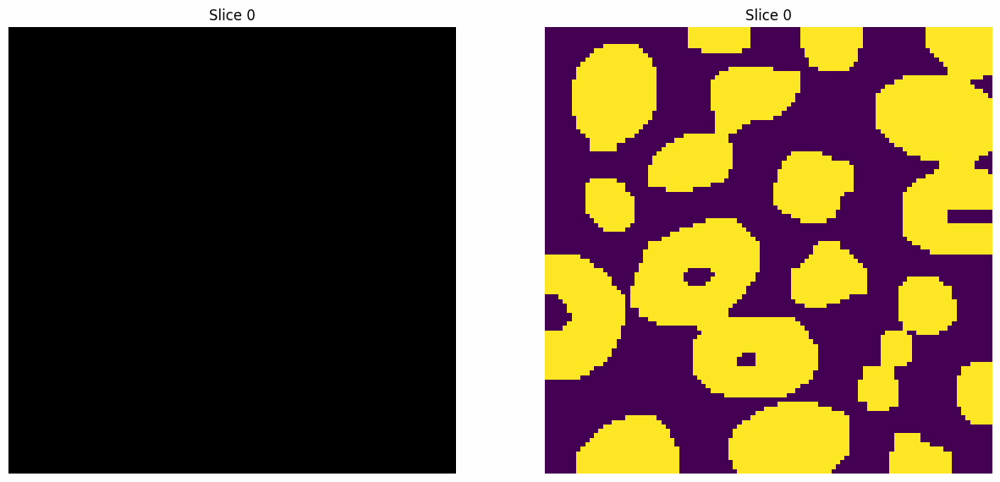

In [168]:
def plot_colored_slices(colors_rgb: torch.Tensor, n_slices=5):
    frames = []
    D = colors_rgb.shape[0]
    
    for z in range(100):
        fig, ax = plt.subplots(1, 2, figsize=(15,15))
        img = colors_rgb[z].numpy()
        ax[0].imshow(img)
        ax[0].axis("off")
        ax[0].set_title(f"Slice {z}")
        ax[1].imshow(voxel_binary[z])
        ax[1].axis("off")
        ax[1].set_title(f"Slice {z}")
        

        buf = io.BytesIO()
        fig.savefig(buf, format="png", bbox_inches="tight")
        plt.close(fig)
    
        buf.seek(0)
        frames.append(Image.open(buf))
    
    display_gif(frames)

colors, labels = color_balls_single_seed(binary, summits)
plot_colored_slices(colors)